# **Coin Detection, Classification, and Counting**

*Image Processing and Computer Vision — Assignment Module #1*

Group members:

- Annalisa Poluzzi
- Jacopo Francesco Amoretti
- Alessia Andrea Toma

## Pipeline overview

The goal of the notebook is to detect all coins in the target photographs, assign a euro denomination to each detected coin and compute the total monetary value. The complete procedure is based on traditional image-processing and feature-matching methods and is organised into the following stages.

1. **Dataset preparation and inspection**  
   Reference and target images are loaded in colour and grayscale form. A preliminary inspection identifies channel-order issues, background texture, noise, blur, illumination changes, rotation, scale variation and oblique viewpoints.

2. **Coin detection**  
   Each target image is smoothed with Gaussian and median filters, followed by a morphological closing operation. A circular Hough transform then estimates the centre and radius of every coin candidate. The stability of the radial edge is also measured to determine whether the detected circle is reliable enough for later size comparisons.

3. **ROI extraction and preprocessing**  
   Every detected circle is cropped and isolated with a circular mask. Small luminous spikes are detected through a comparison with a median-filtered image and removed locally. A mild bilateral filter reduces the remaining noise while preserving the edges of numerals and engravings.

4. **Appearance description**  
   Each coin is resized to a common resolution and enhanced with CLAHE. SIFT provides local keypoints and descriptors, while a polar gradient representation captures the overall radial structure and allows comparisons over different coin rotations.

5. **Weighted classification**  
   Colour measurements first separate bronze, gold and bimetallic coins. Within the selected family, SIFT and polar-template evidence are combined to compare the target coin with the eight references. For €1 and €2, the centre/ring metal order provides an additional distinction.

6. **Relative-size consistency**  
   When an image contains multiple sufficiently frontal coins, their radius ratios are compared with the known physical diameter ratios. Size remains a soft correction and receives little or no weight when the circular boundary is unreliable.

7. **Result aggregation and visual inspection**  
   The selected denominations are collected in a table, summed for each image and then combined into the final estimated value. A random visual sample displays the predicted labels, detection circles and decision margins for a qualitative inspection of the output.

In compact form, the pipeline is:

`images → smoothing → Hough circles → masked coin ROIs → denoising → colour/SIFT/polar features → weighted denomination → size consistency → monetary total`

## 1. Dataset preparation and preliminary inspection

This first section loads the required libraries and organises the available images into data structures that will be reused throughout the notebook. OpenCV is used for image processing, NumPy for numerical operations, Matplotlib for visual inspection and Pandas for the final tabular summary.

Several representations of the same image are retained because the following stages need different information. Circle detection mainly relies on grayscale intensity and edges, whereas classification also uses colour. Storing these versions once avoids reading and converting the files repeatedly.

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd


### 1.1 Reference set

The reference set contains one image for each of the eight euro denominations. The denominations are associated with their monetary value in cents, then every reference is loaded in BGR, RGB and grayscale form.

The figure produced below provides an initial check of the reference material. This is particularly important in a template-based approach, since blur or poor contrast in a reference image will also limit the quality of all comparisons made with that reference.

In [ ]:
coin_values = {
    "1cent":1,
    "2cent":2,
    "5cent":5,
    "10cent":10,
    "20cent":20,
    "50cent":50,
    "1euro":100,
    "2euro":200
}

reference_names = list(coin_values.keys())

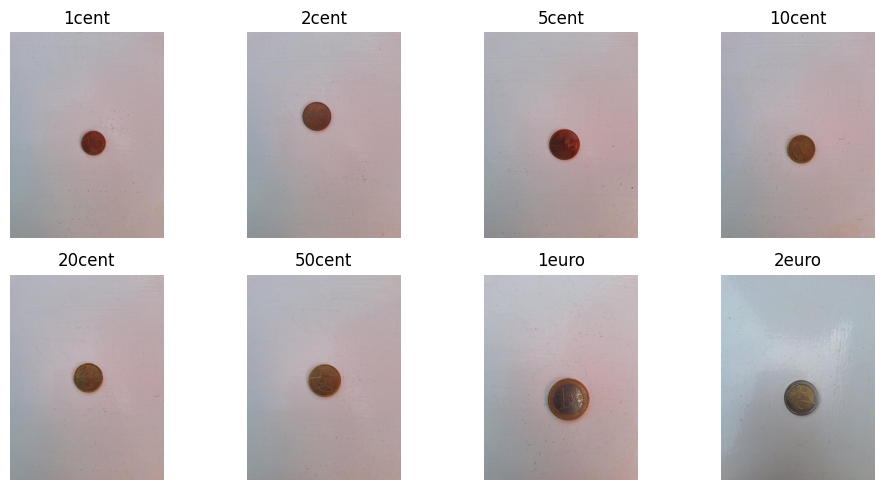

In [ ]:
ref_path = "coin_dataset/reference_set"
reference_data = []

for name, value in coin_values.items():
    img_path = f"{ref_path}/{name}.jpg"
    img_bgr = cv2.imread(img_path)

    reference_data.append(
        {
            "name": name,
            "value": value,
            "path": img_path,
            "bgr":img_bgr,
            "rgb": cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB),
            "gray": cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
        }
    )

fig, axs = plt.subplots(2, 4, figsize=(10, 5))

for ax, data in zip(axs.ravel(), reference_data):
    ax.imshow(data["rgb"])
    ax.set_title(f"{data['name']}")
    ax.axis("off")

plt.tight_layout()
plt.show()

### 1.2 Target set

The target set contains 142 photographs with one or more coins. Unlike the references, these images were acquired under many different conditions. Background, illumination, camera distance, rotation and viewpoint can all vary.

Before defining the processing pipeline, one target image is opened to check how its channels are stored. A wrong colour convention would have little effect on grayscale detection, but it would directly damage the later separation between bronze, gold and bimetallic coins.

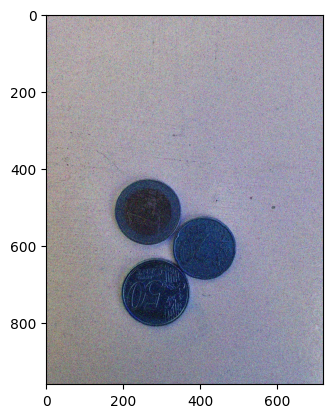

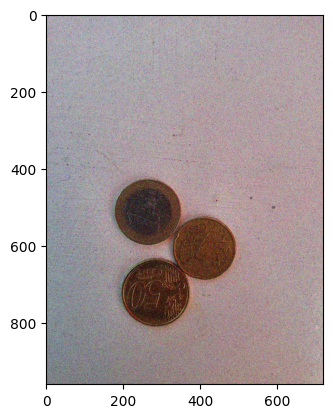

In [ ]:
target_path = "coin_dataset/target_set"

test_img_path = f"{target_path}/image_49.jpg"
test_img_bgr = cv2.imread(test_img_path)
test_img_rgb = cv2.cvtColor(test_img_bgr, cv2.COLOR_BGR2RGB)
test_img_rgb2bgr = cv2.cvtColor(test_img_rgb, cv2.COLOR_RGB2BGR)

plt.imshow(test_img_rgb)
plt.show()

plt.imshow(test_img_rgb2bgr)
plt.show()

#### 1.2.1 Colour-channel convention

OpenCV normally reads images in BGR order, while Matplotlib expects RGB. In the target set, however, the photographs already appear to contain an inverted red/blue interpretation. Applying the usual conversion for display produces visibly implausible colours.

For this reason, the array returned by `cv2.imread` is used as the working colour image for the targets. A converted copy is still retained, and the grayscale representation is computed consistently from the same input. The convention is then kept unchanged throughout the notebook, especially when hue and saturation are measured.

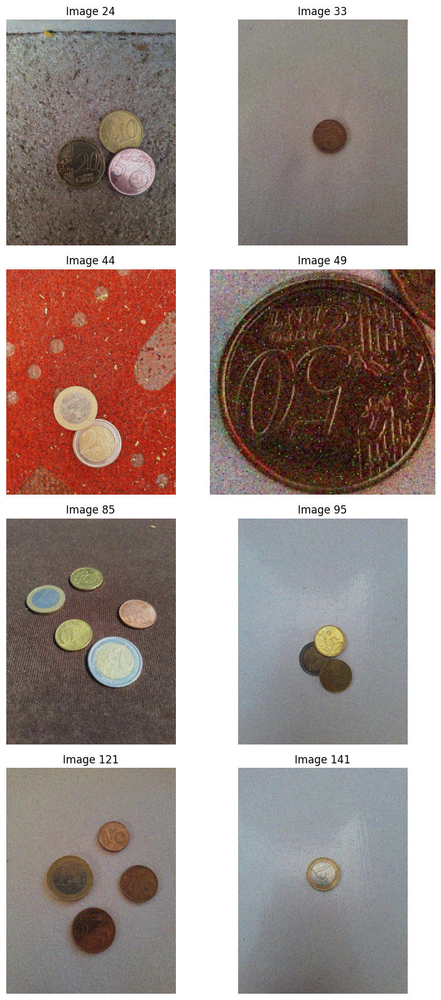

In [ ]:
# Load the target images once and keep the representations used later.
target_data = []

for idx in range(1, 143):
    img_path = f"{target_path}/image_{idx}.jpg"
    img_rgb = cv2.imread(img_path)

    target_data.append({
        "index": idx,
        "path": img_path,
        "rgb": img_rgb,
        "bgr": cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB),
        "gray": cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)
    })

# A few difficult examples for the initial inspection.
target_indices_inspect = [24, 33, 44, 49, 85, 95, 121, 141]
selected_target_data = [target_data[i - 1] for i in target_indices_inspect]

# Crop image 49 so that its local noise remains visible in the plot.
image49_cropped = target_data[48]["rgb"][630:810, 190:370]

fig, axs = plt.subplots(4, 2, figsize=(8, 16))

for ax, data in zip(axs.ravel(), selected_target_data):
    img_rgb = data["rgb"]

    if data["index"] == 49:
        img_rgb = image49_cropped

    ax.imshow(img_rgb)
    ax.set_title(f"Image {data['index']}")
    ax.axis("off")

plt.tight_layout()
plt.show()

#### 1.2.2 Sources of variability

A small group of difficult images is shown to identify the main problems before selecting the algorithms. The dataset includes:

- textured backgrounds, particularly in images 24, 44 and 85;
- grain-like noise over otherwise uniform regions;
- isolated green luminous points on some coin surfaces (see ROI of 49);
- strong changes in illumination and local shadows, as noticeable in image 24;
- partial occlusion, for example in image 95;
- oblique viewpoints that project a circle as an ellipse, as in 85;
- changes in scale and arbitrary in-plane rotation.

These observations motivate two related but distinct processing paths. Detection will rely mainly on shape and intensity, while classification will combine local texture, global appearance, colour and a cautious use of relative size. No single cue is expected to remain reliable under every disturbance.

## 2. Coin detection

The first computational task is to locate every coin in each target image. Since euro coins are approximately circular when viewed from the front, the detector is based on the circular Hough transform.

Before running the transform, the images are converted to grayscale and smoothed. The objective is not to remove all texture, but to suppress small variations that would otherwise create many irrelevant edge responses. Detection and classification are kept separate: the detector only proposes circular regions, while the monetary value is assigned later.

### 2.1 Grayscale representation

The `target_data` structure already contains a grayscale version of every target image. Colour is not needed to detect the circular boundary, and removing it reduces the amount of information that can generate spurious responses.

The original colour arrays are not discarded. They remain linked to the grayscale images and will be used after detection, when each circular region is cropped and classified.

### 2.2 Selecting a smoothing filter

Noise reduction must balance two opposite requirements. A strong filter makes textured backgrounds less problematic, but it may also weaken the rim of a coin or remove details needed later. Three common filters are compared on a difficult region:

- a Gaussian filter, which reduces small local variations efficiently;
- a median filter, which is robust to isolated bright or dark pixels;
- a bilateral filter, which smooths intensity while attempting to preserve edges.

The following cell applies all three filters to the same crop. This visual comparison is used only to choose the pre-procesing strategy; classification features are extracted through a separate, less aggressive path.

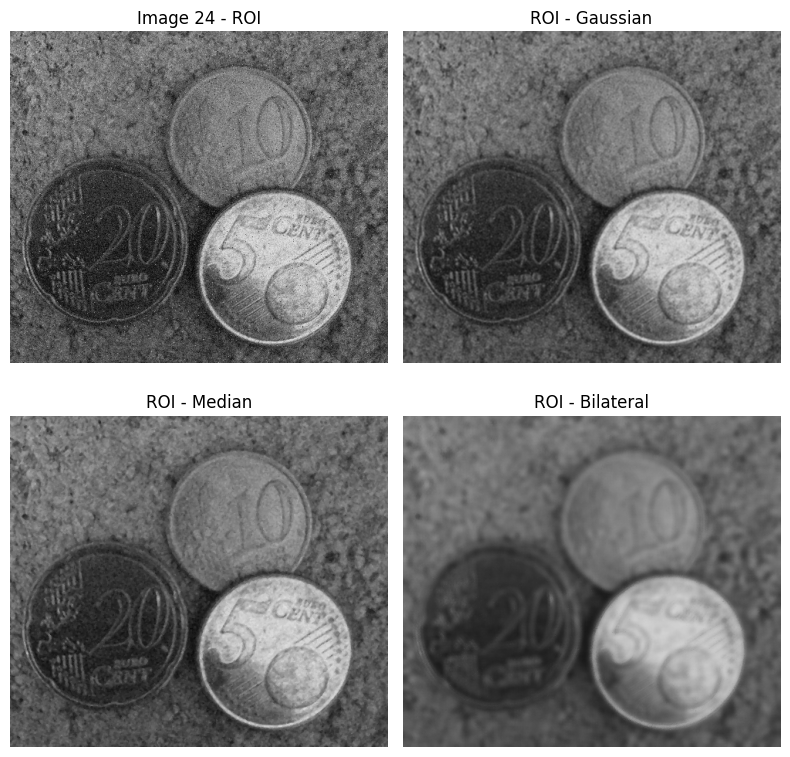

In [ ]:
image_idx = 24
sample = target_data[image_idx - 1]

gray = sample["gray"]

y1, y2 = 340, 770
x1, x2 = 190, 680
roi_gray = gray[y1:y2, x1:x2]

filters = {
    "Gaussian": lambda image: cv2.GaussianBlur(image, (3,3), 0),
    "Median": lambda image: cv2.medianBlur(image, 3),
    "Bilateral": lambda image: cv2.bilateralFilter(image, 11, 100, 100),
}

images_to_show = [
    (f"Image {image_idx} - ROI", roi_gray, None),
    *[(f"ROI - {name}", filt(roi_gray), "gray") for name, filt in filters.items()],
]

fig, axs = plt.subplots(2,2, figsize=(8,8))

for ax, (title, image, cmap) in zip(axs.ravel(), images_to_show):
    ax.imshow(image, cmap="gray", vmin=0, vmax=255)

    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()


#### 2.2.1 Selected filtering strategy

The comparison shows that a small Gaussian filter removes a useful portion of the fine background variation without destroying the visible coin boundary. For the final Hough input, Gaussian and median smoothing are combined with a morphological closing operation. The larger effective smoothing is justified here because this branch is used only for circle detection, not for recognising engravings.

### 2.3 Circular Hough transform

The circular Hough transform searches for groups of edge pixels that support a common centre and radius. Its parameters control the resolution of the accumulator, the minimum distance between detections, the edge threshold, the required voting strength and the accepted radius interval.

The chosen radius range covers the scale variation observed in the target set. A minimum centre distance reduces duplicate detections on the same coin, while `param2` controls how much circular evidence is required. The cell below displays twenty random images, followed by four difficult examples in the last row. This gives a broad view of normal behaviour while still including a small stress test.

Hough detection run on selected images only: [114, 4, 61, 116, 40, 23, 71, 68, 34, 7, 89, 109, 102, 115, 98, 119, 91, 52, 80, 75, 44, 55, 85, 132]
['image 114: 1 circles', 'image 4: 1 circles', 'image 61: 1 circles', 'image 116: 1 circles', 'image 40: 5 circles', 'image 23: 1 circles', 'image 71: 1 circles', 'image 68: 1 circles', 'image 34: 1 circles', 'image 7: 3 circles', 'image 89: 2 circles', 'image 109: 1 circles', 'image 102: 3 circles', 'image 115: 4 circles', 'image 98: 4 circles', 'image 119: 1 circles', 'image 91: 1 circles', 'image 52: 6 circles', 'image 80: 2 circles', 'image 75: 2 circles', 'image 44: 2 circles', 'image 55: 2 circles', 'image 85: 5 circles', 'image 132: 4 circles']


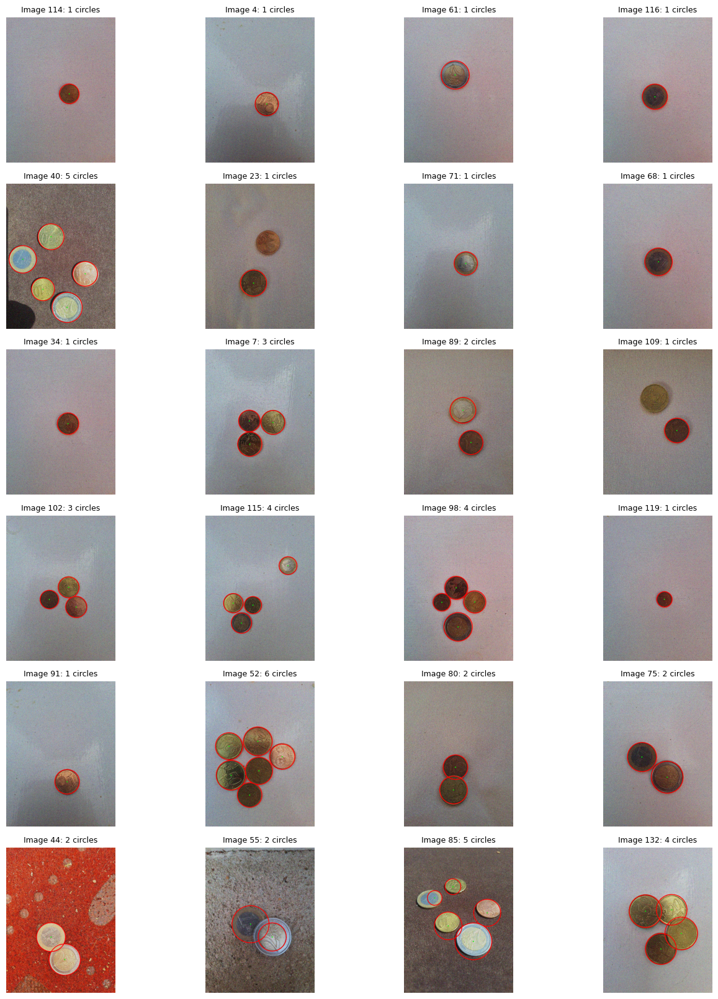

In [ ]:
def preprocess_for_hough(gray):
    gray = cv2.GaussianBlur(gray, (9, 9), 1)
    gray = cv2.medianBlur(gray, 7)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    textured_killed = cv2.morphologyEx(gray, cv2.MORPH_CLOSE, kernel)

    return textured_killed


def detect_hough_circles(
    image,
    dp=1.2,
    min_dist=75,
    param1=120,
    param2=33,
    min_radius=35,
    max_radius=125,
):
    circles = cv2.HoughCircles(
        image,
        cv2.HOUGH_GRADIENT,
        dp=dp,
        minDist=min_dist,
        param1=param1,
        param2=param2,
        minRadius=min_radius,
        maxRadius=max_radius,
    )

    if circles is None:
        return np.empty((0, 3), dtype=int)

    return np.round(circles[0]).astype(int)


N_RANDOM_HOUGH_IMAGES = 20
difficult_hough_indices = [44,55, 85,132]

# Keep the difficult cases in the last row of the figure.
all_target_indices = np.arange(1, len(target_data) + 1)
random_pool = np.setdiff1d(all_target_indices, difficult_hough_indices)
random_hough_indices = np.random.choice(
    random_pool, size=N_RANDOM_HOUGH_IMAGES, replace=False
).tolist()

hough_indices = random_hough_indices + difficult_hough_indices
hough_data = [target_data[i - 1] for i in hough_indices]

for data in hough_data:
    data["hough_input"] = preprocess_for_hough(data["gray"])
    data["hough_circles"] = detect_hough_circles(data["hough_input"])

print(f"Hough detection run on selected images only: {hough_indices}")
print([f"image {data['index']}: {len(data['hough_circles'])} circles" for data in hough_data])


# Compact overview of the selected Hough results.
ncols = 4
nrows = int(np.ceil(len(hough_data) / ncols))
fig, axs = plt.subplots(nrows, ncols, figsize=(14, 2.7 * nrows))
axs = np.asarray(axs).ravel()

for ax, data in zip(axs, hough_data):
    img_rgb = data["rgb"].copy()

    for x, y, r in data["hough_circles"]:
        cv2.circle(img_rgb, (x, y), r, (255, 0, 0), 3)
        cv2.circle(img_rgb, (x, y), 2, (0, 255, 0), 3)

    ax.imshow(img_rgb)
    ax.set_title(
        f"Image {data['index']}: {len(data['hough_circles'])} circles",
        fontsize=9
    )
    ax.axis("off")

for ax in axs[len(hough_data):]:
    ax.axis("off")

plt.tight_layout()
plt.show()


#### 2.3.1 Qualitative check of the detections

The first five rows contain a new random sample each time the cell is executed. They provide a less selective view of the detector and help check that the chosen parameters work across different backgrounds, scales and numbers of coins.

The final row contains four deliberately difficult images. These examples include stronger background texture, changes in viewpoint and crowded scenes. They are kept at the end of the figure so that occasional missed or less precise circles can be examined without making the whole visualisation depend only on problematic cases.

#### 2.3.2 Detection on the complete target set

After checking the parameters on the selected examples, the same detector is applied to all 142 target images. The detected circles are stored inside each image record rather than recomputed later.

The printed total is the number of circular regions found by the algorithm. At this point no denomination has been assigned: every circle is simply a candidate coin that will be cropped and analysed in the next sections.

In [ ]:
detected_circle_count = 0
for data in target_data:
    data["hough_input"] = preprocess_for_hough(data["gray"])
    data["hough_circles"] = detect_hough_circles(data["hough_input"])

    detected_circle_count += len(data["hough_circles"])
print(f"Detected circles: {detected_circle_count}")

print(f"Hough detection saved inside target_data for {len(target_data)} images.")

Detected circles: 319
Hough detection saved inside target_data for 142 images.


#### 2.3.3 Detection on the reference set

The same detection procedure is also applied to the eight reference images. This provides a consistent definition of the coin centre and radius on both sides of every comparison.

The resulting plot is a visual sanity check of the reference crops. If a reference circle were badly centred, its black mask and polar representation would also be misaligned, making all later similarity scores less meaningful.

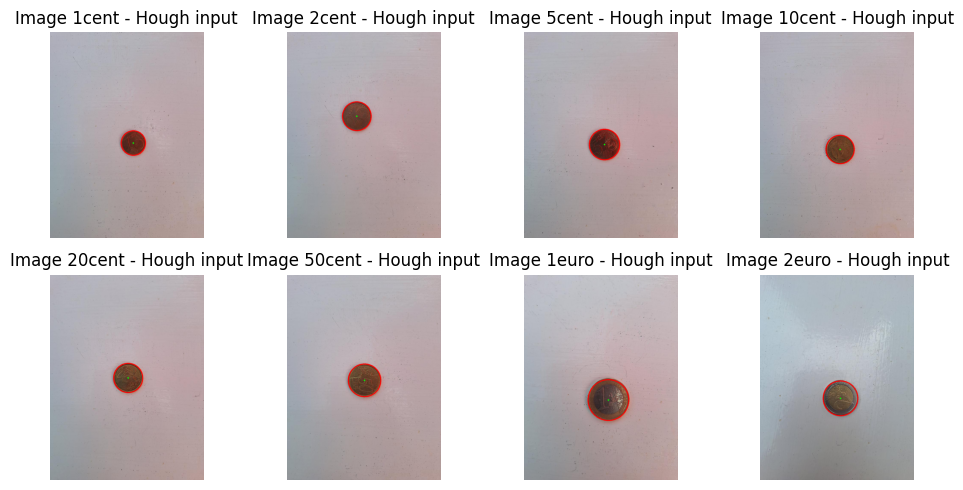

In [ ]:
for data in reference_data:
    data["hough_input"] = preprocess_for_hough(data["gray"])
    data["hough_circles"] = detect_hough_circles(data["hough_input"])


fig, axs = plt.subplots(2, 4, figsize=(10, 5))

for row, data in zip(axs.ravel(), reference_data):
    row.set_title(f"Image {data['name']} - Hough input")
    row.axis("off")

    img_rgb = cv2.cvtColor(data["bgr"], cv2.COLOR_BGR2RGB).copy()

    for x, y, r in data["hough_circles"]:
        cv2.circle(img_rgb, (x, y), r, (255, 0, 0), 3)
        cv2.circle(img_rgb, (x, y), 2, (0, 255, 0), 3)

    row.imshow(img_rgb)
    row.axis("off")

plt.tight_layout()
plt.show()




### 2.4 Reliability of the circular boundary

A Hough circle can still be returned for an oblique coin, even though its projected outline is closer to an ellipse. In that situation, the measured radius is less suitable for reasoning about physical coin size.

For each detected centre, the next cell samples gradient strength along 180 radial directions. It searches for the strongest edge near the expected boundary and measures the dispersion of the corresponding radii. A frontal coin should produce a stable radius, while an oblique or poorly detected coin produces a larger spread.

The dispersion is converted into a reliability value between 0 and 1. This value does not reject a detection and does not modify appearance features. It is used only to reduce the influence of relative size when the geometry is uncertain.

In [ ]:
def circular_edge_reliability(gray, circle):
    """Return reliability and radial-edge dispersion around a Hough circle."""
    x, y, radius = map(float, circle)
    blurred = cv2.GaussianBlur(gray, (5, 5), 1.0)
    gx = cv2.Sobel(blurred, cv2.CV_32F, 1, 0, 3)
    gy = cv2.Sobel(blurred, cv2.CV_32F, 0, 1, 3)
    gradient = np.sqrt(gx*gx + gy*gy)

    angles = np.linspace(0, 2*np.pi, 180, endpoint=False)
    radii = np.linspace(0.65*radius, 1.08*radius, 45)
    sample_x = x + radii[:, None] * np.cos(angles)[None, :]
    sample_y = y + radii[:, None] * np.sin(angles)[None, :]
    samples = cv2.remap(
        gradient, sample_x.astype(np.float32), sample_y.astype(np.float32),
        cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT
    )

    peak_indices = np.argmax(samples, axis=0)
    peak_radii = radii[peak_indices]
    peak_strength = samples[peak_indices, np.arange(len(angles))]
    strong = peak_strength > np.percentile(peak_strength, 35)
    dispersion = float(np.std(peak_radii[strong]) /
                       (np.mean(peak_radii[strong]) + 1e-6))

    # Low dispersion indicates a nearly frontal coin.
    reliability = float(np.clip((0.09 - dispersion) / 0.05, 0, 1))
    return reliability, dispersion

for data in target_data:
    data["circle_reliability"] = [
        circular_edge_reliability(data["gray"], circle)
        for circle in data["hough_circles"]
    ]


## 3. Preprocessing the detected coins

Once the circular regions have been located, each candidate is extracted from its source image. From this point onward, processing is performed at coin level rather than on the complete image.

Cropping reduces the amount of background seen by the feature detectors. A circular binary mask is also created so that pixels outside the Hough circle are replaced by black. The mask, crop coordinates and circle information are retained together, since later stages need to distinguish real coin pixels from the artificial background.

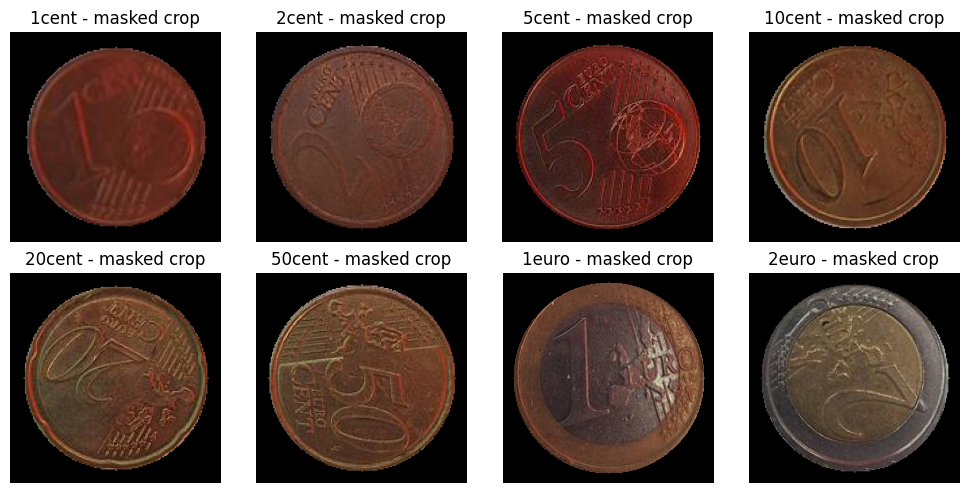

In [ ]:
def crop_mask_circle_roi(image, circle, padding=10, background_value=0):
    x, y, r = circle

    x1 = max(0, x - r - padding)
    y1 = max(0, y - r - padding)
    x2 = min(image.shape[1], x + r + padding)
    y2 = min(image.shape[0], y + r + padding)

    roi = image[y1:y2, x1:x2].copy()
    local_x = x - x1
    local_y = y - y1

    mask = np.zeros(roi.shape[:2], dtype=np.uint8)
    cv2.circle(mask, (local_x, local_y), r, 255, -1)

    masked_roi = np.full_like(roi, background_value)
    masked_roi[mask == 255] = roi[mask == 255]

    return masked_roi, mask


ref_coin_rois = []

for data in reference_data:
    img_rgb = data["rgb"]
    data["coin_rois"] = []

    for circle_idx, circle in enumerate(data["hough_circles"]):
        roi_rgb, mask = crop_mask_circle_roi(img_rgb, circle)
        roi_gray = cv2.cvtColor(roi_rgb, cv2.COLOR_RGB2GRAY)

        coin_roi = {
            "source": "reference",
            "name": data["name"],
            "value": data["value"],
            "circle_idx": circle_idx,
            "circle": circle,
            "rgb": roi_rgb,
            "gray": roi_gray,
            "mask": mask,
        }

        data["coin_rois"].append(coin_roi)
        ref_coin_rois.append(coin_roi)

fig, axs = plt.subplots(2, 4, figsize=(10, 5))
axs = axs.ravel()

for ax, coin in zip(axs, ref_coin_rois):
    ax.imshow(coin["rgb"])
    ax.set_title(f"{coin['name']} - masked crop")
    ax.axis("off")

for ax in axs[len(ref_coin_rois):]:
    ax.axis("off")

plt.tight_layout()
plt.show()


### 3.1 Target coin regions

The extraction procedure used for the references is now repeated for every detected target circle. In addition to the RGB and grayscale crops, each target coin stores its source image index, radius, circular-edge reliability and mask.

A random sample of the resulting regions is displayed. This helps verify that the crops are centred and that the circular mask removes most of the surrounding background without cutting away a large part of the coin.

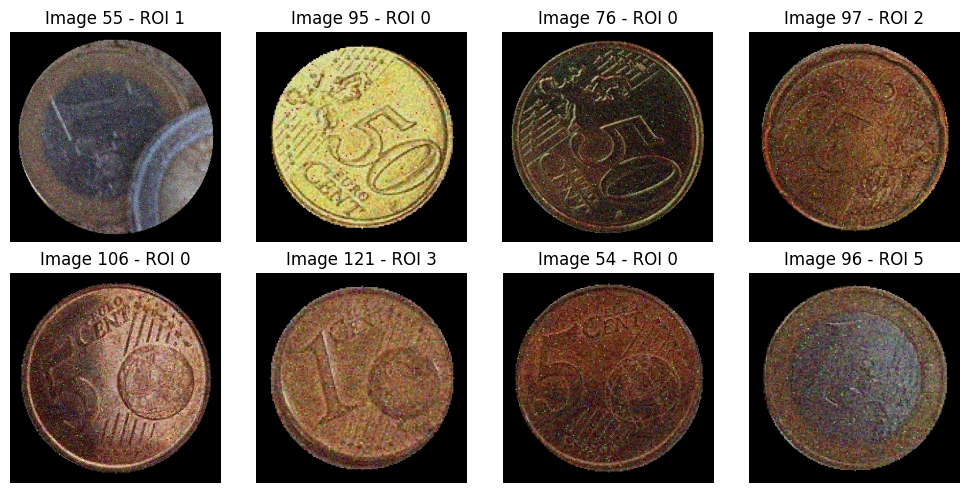

In [ ]:
target_coin_rois = []

for data in target_data:
    img_rgb = data["rgb"]
    data["coin_rois"] = []

    for circle_idx, circle in enumerate(data["hough_circles"]):
        roi_rgb, mask = crop_mask_circle_roi(img_rgb, circle)
        roi_gray = cv2.cvtColor(roi_rgb, cv2.COLOR_RGB2GRAY)

        reliability, edge_dispersion = data["circle_reliability"][circle_idx]

        coin_roi = {
            "source": "target",
            "image_index": data["index"],
            "path": data["path"],
            "circle_idx": circle_idx,
            "circle": circle,
            "effective_radius": float(circle[2]),
            "geometry_reliability": reliability,
            "edge_dispersion": edge_dispersion,
            "rgb": roi_rgb,
            "gray": roi_gray,
            "mask": mask,
        }

        data["coin_rois"].append(coin_roi)
        target_coin_rois.append(coin_roi)

n_to_show = min(8, len(target_coin_rois))
np.random.seed(41)
random_indices = np.random.choice(
    len(target_coin_rois),
    size=n_to_show,
    replace=False
)

random_rois = [target_coin_rois[i] for i in random_indices]

fig, axs = plt.subplots(2, 4, figsize=(10, 5))
axs = axs.ravel()

for ax, coin in zip(axs, random_rois):

    ax.imshow(coin["rgb"])
    ax.set_title(f"Image {coin['image_index']} - ROI {coin['circle_idx']}")
    ax.axis("off")

plt.tight_layout()
plt.show()

### 3.2 Removal of isolated luminous spikes

Some target coins contain small bright green points that resemble impulse noise, although they are not exactly black or white. These points can create unstable gradients and artificial SIFT keypoints.

To detect them, the original crop is compared with a median-filtered version. Pixels with a large colour difference are considered candidates, but stable edges are excluded so that genuine engraving details are not replaced. Connected components larger than a small area are also preserved. Only isolated components inside the eroded coin mask are copied from the median image.

The figure shows the original crop, the detected spike mask and the cleaned result. The correction is deliberately local: most pixels remain unchanged.

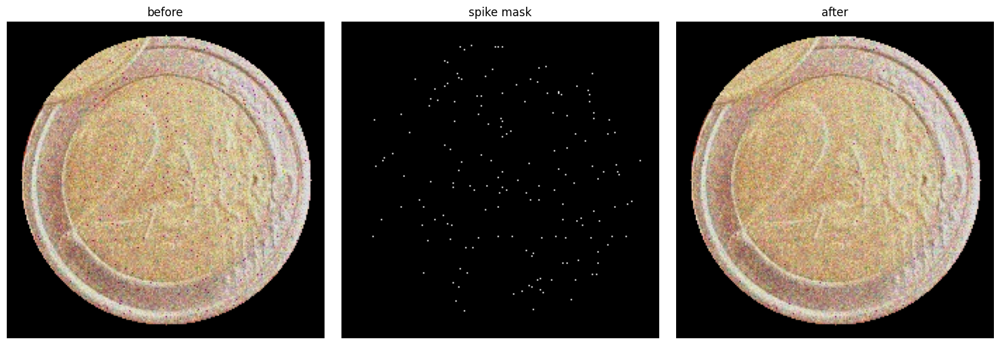

In [ ]:
def remove_spikes_simple(coin, threshold=170, window_size=5, max_spike_area=9):
    image = coin["rgb"]
    cleaned = image.copy()

    coin_mask = coin["mask"].astype(np.uint8)
    interior = cv2.erode(coin_mask, np.ones((5, 5), np.uint8)) > 0

    median_image = cv2.medianBlur(image, window_size)

    difference = np.abs(image.astype(int) - median_image.astype(int))

    spike_score = (
        difference[:, :, 0]
        + difference[:, :, 1]
        + difference[:, :, 2]
    )

    median_brightness = median_image.astype(np.float32).mean(axis=2).astype(np.uint8)
    stable_edges = cv2.Canny(median_brightness, 50, 100)
    stable_edges = cv2.dilate(stable_edges, np.ones((3, 3), np.uint8)) > 0

    candidates = (spike_score > threshold) & interior & ~stable_edges

    n_labels, labels, stats, _ = cv2.connectedComponentsWithStats(
        candidates.astype(np.uint8), connectivity=8
    )
    spike_mask = np.zeros_like(candidates)

    for label in range(1, n_labels):
        if stats[label, cv2.CC_STAT_AREA] <= max_spike_area:
            spike_mask[labels == label] = True

    cleaned[spike_mask] = median_image[spike_mask]

    return cleaned, spike_mask

coin_to_show = next(
    coin for coin in target_coin_rois
    if coin["image_index"] == 44 and coin["circle_idx"] == 0
)

cleaned, spike_mask = remove_spikes_simple(
    coin_to_show,
    threshold=170,
    window_size=5
)

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(coin_to_show["rgb"])
axs[0].set_title("before")
axs[0].axis("off")

axs[1].imshow(spike_mask, cmap="gray")
axs[1].set_title("spike mask")
axs[1].axis("off")

axs[2].imshow(cleaned)
axs[2].set_title("after")
axs[2].axis("off")

plt.tight_layout()
plt.show()

for coin in target_coin_rois:
    cleaned, spike_mask = remove_spikes_simple(
        coin,
        threshold=170,
        window_size=5
    )

    coin["rgb_spike_cleaned"] = cleaned
    coin["spike_mask"] = spike_mask

### 3.3 Grayscale enhancement for matching

After spike removal, a mildly denoised grayscale image is prepared for appearance matching. The spike mask identifies the pixels that should be replaced by their median-filtered value, while a bilateral filter reduces smaller fluctuations across the rest of the surface.

The bilateral paramters are intentionally conservative. Excessive smoothing would erase the thin edges of numerals and engravings, which are precisely the structures needed by SIFT and the polar descriptor. Pixels outside the circular mask are set to zero at the end.

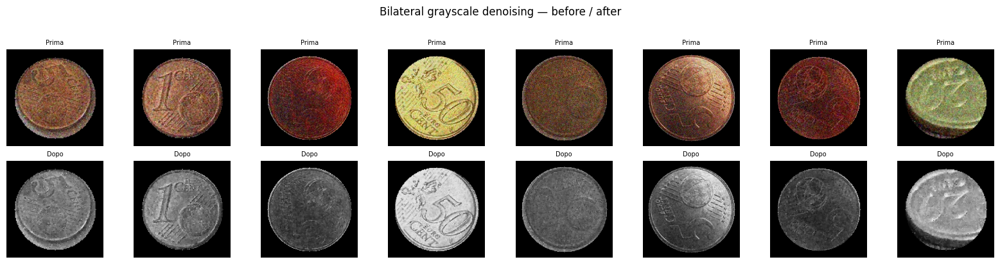

In [ ]:
def preprocess_coin(coin):
    gray = coin["gray"].copy()
    mask = coin["mask"]

    if "spike_mask" in coin:
        median_gray = cv2.medianBlur(gray, 5)
        gray[coin["spike_mask"]] = median_gray[coin["spike_mask"]]

    denoised = cv2.bilateralFilter(gray, d=5, sigmaColor=18, sigmaSpace=2)
    denoised[mask == 0] = 0
    return denoised
for coin in target_coin_rois:
    coin["gray_final"] = preprocess_coin(coin)

for coin in ref_coin_rois:
    coin["gray_final"] = preprocess_coin(coin)

np.random.seed(42)
sample_indices = np.random.choice(len(target_coin_rois), size=8, replace=False)

fig, axs = plt.subplots(2, 8, figsize=(16, 4))
for i, idx in enumerate(sample_indices):
    coin = target_coin_rois[idx]
    axs[0, i].imshow(coin["rgb_spike_cleaned"])
    axs[0, i].set_title("Prima", fontsize=7)
    axs[0, i].axis("off")
    axs[1, i].imshow(coin["gray_final"], cmap="gray")
    axs[1, i].set_title("Dopo", fontsize=7)
    axs[1, i].axis("off")

plt.suptitle("Bilateral grayscale denoising — before / after", y=1.02)
plt.tight_layout()
plt.show()

## 4. Appearance descriptors

The denomination cannot be inferred from colour alone because several coins share the same metal family. Appearance is therefore represented with two complementary traditional descriptors: local SIFT features and a rotation-tolerant polar template.

### 4.1 SIFT keypoints and descriptors

SIFT detects distinctive local structures and describes the intensity pattern around each keypoint. Before extraction, every coin is resized to a common 256 × 256 canvas. This prevents larger source images from receiving more keypoints merely because they contain more pixels.

CLAHE is applied inside a slightly eroded circular mask to reveal faint details in dark or low-contrast regions. Eroding the mask avoids detecting keypoints on the artificial border between the coin and black background. The cell reports reference keypoint counts before and after enhancement and displays representative results.

Target coins: 319
Target keypoints: 128491

Reference keypoints (resized only -> resized + CLAHE):
1cent: 16 -> 121
2cent: 123 -> 346
5cent: 344 -> 410
10cent: 173 -> 350
20cent: 256 -> 388
50cent: 258 -> 418
1euro: 386 -> 450
2euro: 360 -> 438


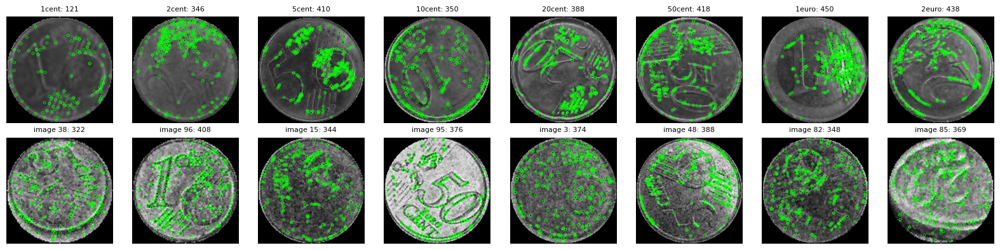

In [ ]:
# Parameters were kept moderately permissive because some coins are blurred.
sift = cv2.SIFT_create(
    nfeatures=500,
    nOctaveLayers=3,
    contrastThreshold=0.03,
    edgeThreshold=12,
    sigma=1.2
)

SIFT_SIZE = (256, 256)
clahe = cv2.createCLAHE(clipLimit=1.5, tileGridSize=(8, 8))

def detect_sift_keypoints(coin):
    # Use the same resolution for every coin.
    ys, xs = np.where(coin["mask"] > 0)
    y1, y2 = ys.min(), ys.max() + 1
    x1, x2 = xs.min(), xs.max() + 1
    coin_image = coin["gray_final"][y1:y2, x1:x2]
    coin_mask = coin["mask"][y1:y2, x1:x2]

    image = cv2.resize(coin_image, SIFT_SIZE, interpolation=cv2.INTER_CUBIC)
    mask = cv2.resize(coin_mask, SIFT_SIZE, interpolation=cv2.INTER_NEAREST)

    # Ignore the artificial edge created by the black background.
    inner_mask = cv2.erode(
        mask,
        np.ones((9, 9), dtype=np.uint8)
    )

    # CLAHE makes faint engravings easier to detect.
    enhanced = clahe.apply(image)
    enhanced[mask == 0] = 0

    baseline_keypoints = sift.detect(image, inner_mask)
    keypoints, descriptors = sift.detectAndCompute(enhanced, inner_mask)

    coin["sift_image"] = enhanced
    coin["sift_mask"] = inner_mask
    coin["sift_baseline_count"] = len(baseline_keypoints)
    coin["sift_keypoints"] = keypoints
    coin["sift_descriptors"] = descriptors


# Extract descriptors from both sets.
for coin in target_coin_rois + ref_coin_rois:
    detect_sift_keypoints(coin)

print("Target coins:", len(target_coin_rois))
print("Target keypoints:", np.sum([
    len(coin["sift_keypoints"]) for coin in target_coin_rois
]))

print("\nReference keypoints (resized only -> resized + CLAHE):")
for coin in ref_coin_rois:
    print(
        f"{coin['name']}: {coin['sift_baseline_count']} -> "
        f"{len(coin['sift_keypoints'])}"
    )


# Reference examples above, target examples below.
np.random.seed(42)
sample_indices = np.random.choice(len(target_coin_rois), size=8, replace=False)
target_samples = [target_coin_rois[index] for index in sample_indices]

fig, axes = plt.subplots(2, 8, figsize=(16, 4))

for column in range(8):
    reference_coin = ref_coin_rois[column]
    target_coin = target_samples[column]

    reference_result = cv2.drawKeypoints(
        reference_coin["sift_image"],
        reference_coin["sift_keypoints"],
        None,
        color=(0, 255, 0)
    )
    target_result = cv2.drawKeypoints(
        target_coin["sift_image"],
        target_coin["sift_keypoints"],
        None,
        color=(0, 255, 0)
    )

    axes[0, column].imshow(reference_result)
    axes[0, column].set_title(
        f"{reference_coin['name']}: {len(reference_coin['sift_keypoints'])}",
        fontsize=8
    )

    axes[1, column].imshow(target_result)
    axes[1, column].set_title(
        f"image {target_coin['image_index']}: {len(target_coin['sift_keypoints'])}",
        fontsize=8
    )

    axes[0, column].axis("off")
    axes[1, column].axis("off")

plt.tight_layout()
plt.show()

## 5. Weighted coin classification

Classification combines measurements that respond to different properties of a coin:

1. **SIFT evidence** measures local agreement between engravings;
2. **polar-template evidence** compares the overall radial appearance while handling rotation;
3. **colour evidence** separates bronze, gold and bimetallic families;
4. **relative-size evidence** checks physical diameter ratios when the measured geometry is reliable.

Appearance and colour first produce an independent local score for every detected coin. Size is added afterwards as a soft consistency cue within each image. This ordering is important because pixel radius alone is meaningless when camera distance changes.

The constants and official coin diameters used by the classifier are declared in the next cell. Monetary values are stored in cents to avoid floating-point rounding while totals are accumulated.

In [ ]:
# Values are expressed in cents and diameters in millimetres.
COIN_INFO = {
    "1cent":  {"value": 1,   "family": "bronze",     "diameter_mm": 16.25},
    "2cent":  {"value": 2,   "family": "bronze",     "diameter_mm": 18.75},
    "5cent":  {"value": 5,   "family": "bronze",     "diameter_mm": 21.25},
    "10cent": {"value": 10,  "family": "gold",       "diameter_mm": 19.75},
    "20cent": {"value": 20,  "family": "gold",       "diameter_mm": 22.25},
    "50cent": {"value": 50,  "family": "gold",       "diameter_mm": 24.25},
    "1euro":  {"value": 100, "family": "bimetallic", "diameter_mm": 23.25},
    "2euro":  {"value": 200, "family": "bimetallic", "diameter_mm": 25.75},
}
reference_by_name = {coin["name"]: coin for coin in ref_coin_rois}
candidate_names = list(reference_by_name)


### 5.1 Colour-family evidence

Colour is used to restrict the broad family of plausible denominations, not to distinguish coins that share the same metal. The 1, 2 and 5 cent coins form the bronze family; 10, 20 and 50 cent form the gold family; €1 and €2 are bimetallic.

For every crop, hue is measured in the central area and saturation is compared between the centre and an outer ring. A large centre/ring contrast indicates two different metals. Its sign is also informative because €1 and €2 have opposite metal layouts.

Single-metal target coins are divided into bronze and gold using Otsu's method on their hue distribution. Estimating this split from the target images makes the decision less sensitive to the different white balance of reference and target photographs.

In [ ]:
def colour_features(coin):
    """Return hue and signed centre-minus-ring saturation contrast."""
    rgb = coin.get("rgb_spike_cleaned", coin["rgb"])
    hsv = cv2.cvtColor(rgb, cv2.COLOR_RGB2HSV).astype(np.float32)
    mask = coin["mask"] > 0
    yy, xx = np.indices(mask.shape)
    cx, cy = xx[mask].mean(), yy[mask].mean()
    radius = np.sqrt(mask.sum() / np.pi)
    distance = np.sqrt((xx - cx) ** 2 + (yy - cy) ** 2) / radius
    centre = mask & (distance < 0.50)
    ring = mask & (distance > 0.60) & (distance < 0.88)
    hue = float(np.median(hsv[centre, 0]))
    signed_contrast = float(hsv[centre, 1].mean() - hsv[ring, 1].mean())
    return hue, signed_contrast

for coin in ref_coin_rois + target_coin_rois:
    coin["colour_hue"], coin["signed_bimetal_contrast"] = colour_features(coin)
    coin["bimetal_score"] = abs(coin["signed_bimetal_contrast"])

reference_bimetal = [coin["bimetal_score"] for coin in ref_coin_rois
                     if COIN_INFO[coin["name"]]["family"] == "bimetallic"]
reference_single_metal = [coin["bimetal_score"] for coin in ref_coin_rois
                          if COIN_INFO[coin["name"]]["family"] != "bimetallic"]
# Leave a small margin for the noisier target images.
BIMETAL_THRESHOLD = 0.85 * np.sqrt(
    max(reference_single_metal) * min(reference_bimetal)
)

mono_hues = np.array([coin["colour_hue"] for coin in target_coin_rois
                       if coin["bimetal_score"] < BIMETAL_THRESHOLD], dtype=np.float32)
hue_median = np.median(mono_hues)
hue_mad = 1.4826 * np.median(np.abs(mono_hues - hue_median)) + 1e-6
hue_core = mono_hues[np.abs(mono_hues - hue_median) < 3 * hue_mad]
HUE_THRESHOLD, _ = cv2.threshold(
    np.clip(np.round(hue_core), 0, 179).astype(np.uint8),
    0, 179, cv2.THRESH_BINARY + cv2.THRESH_OTSU
)
bronze_reference_hue = np.median([coin["colour_hue"] for coin in ref_coin_rois
                                  if COIN_INFO[coin["name"]]["family"] == "bronze"])
gold_reference_hue = np.median([coin["colour_hue"] for coin in ref_coin_rois
                                if COIN_INFO[coin["name"]]["family"] == "gold"])
BRONZE_IS_LOW = bronze_reference_hue < gold_reference_hue

# The sign separates the two centre/ring layouts.
EURO_SIGNED_REFERENCE = {
    name: reference_by_name[name]["signed_bimetal_contrast"]
    for name in ("1euro", "2euro")
}

def estimate_colour_family(coin):
    if coin["bimetal_score"] >= BIMETAL_THRESHOLD:
        return "bimetallic"
    below = coin["colour_hue"] < HUE_THRESHOLD
    is_bronze = below if BRONZE_IS_LOW else not below
    return "bronze" if is_bronze else "gold"

for coin in target_coin_rois:
    coin["estimated_family"] = estimate_colour_family(coin)
    coin["estimated_euro"] = min(
        EURO_SIGNED_REFERENCE,
        key=lambda name: abs(coin["signed_bimetal_contrast"] -
                             EURO_SIGNED_REFERENCE[name])
    )
print(f"Bimetal threshold: {BIMETAL_THRESHOLD:.2f}")
print(f"Bronze/gold hue threshold: {HUE_THRESHOLD:.2f}")


Bimetal threshold: 10.17
Bronze/gold hue threshold: 14.00


### 5.2 Geometrically verified SIFT score

For every target-reference pair, descriptor candidates are found with a brute-force Euclidean matcher. Lowe's ratio test keeps a match only when its nearest neighbour is clearly better than the second-nearest one. This removes many ambiguous correspondences.

The remaining points are passed to RANSAC, which estimates an affine transformation and counts geometrically consistent inliers. The score combines the inlier count with the fraction of accepted matches that support the transformation. Evidence grows gradually and remains bounded between 0 and 1.

Reference images contain different numbers of keypoints, so a clipped square-root compensation is applied to sparse references. The affine singular values also provide an approximate axis ratio: a very uneven transformation suggests a tilted observation whose radius should receive less trust.

In [ ]:
reference_keypoint_counts = {
    name: max(len(coin["sift_keypoints"]), 1)
    for name, coin in reference_by_name.items()
}
median_reference_keypoints = np.median(list(reference_keypoint_counts.values()))
reference_weights = {
    name: float(np.clip(
        np.sqrt(median_reference_keypoints / count), 0.80, 1.25
    )) for name, count in reference_keypoint_counts.items()
}

def sift_match_score(target, reference, reference_weight, ratio_threshold=0.75):
    """Return SIFT/RANSAC score and affine axis ratio."""
    target_des = target["sift_descriptors"]
    reference_des = reference["sift_descriptors"]
    if target_des is None or reference_des is None or len(reference_des) < 2:
        return {"score": 0.0, "good_matches": 0, "inliers": 0,
                "inlier_ratio": 0.0, "axis_ratio": 0.0}

    pairs = cv2.BFMatcher(cv2.NORM_L2).knnMatch(target_des, reference_des, k=2)
    good = [first for pair in pairs if len(pair) == 2
            for first, second in [pair]
            if first.distance < ratio_threshold * second.distance]

    inliers, axis_ratio = 0, 0.0
    if len(good) >= 4:
        target_points = np.float32([
            target["sift_keypoints"][m.queryIdx].pt for m in good
        ])
        reference_points = np.float32([
            reference["sift_keypoints"][m.trainIdx].pt for m in good
        ])
        transform, mask = cv2.estimateAffine2D(
            target_points, reference_points,
            method=cv2.RANSAC, ransacReprojThreshold=5.0
        )
        if mask is not None:
            inliers = int(mask.sum())
        if transform is not None and inliers >= 4:
            scales = np.linalg.svd(transform[:, :2], compute_uv=False)
            axis_ratio = float(scales.min() / max(scales.max(), 1e-6))

    inlier_ratio = inliers / max(len(good), 1)
    weighted_inliers = inliers * reference_weight
    count_score = 1.0 - np.exp(-weighted_inliers / 7.0)
    score = count_score * inlier_ratio if inliers >= 3 else 0.0
    return {"score": float(score), "good_matches": len(good),
            "inliers": inliers, "inlier_ratio": float(inlier_ratio),
            "axis_ratio": axis_ratio}


### 5.3 Rotation-tolerant polar template

SIFT can return few stable correspondences when a coin or its reference is blurred. A second appearance descriptor is included to capture coarser radial structure.

The normalized grayscale crop is converted to gradient magnitude and unwrapped into polar coordinates. In this representation, rotating a coin mainly produces a horizontal translation. Circular correlation can therefore test all rotations efficiently and retain the best alignment.

The polar score is not a learned feature and does not replace SIFT; it complements local matching with a more global comparison. In the final appearance score it receives 80% of the weight, while normalized SIFT receives 20%. This balance was selected because the polar representation remains more stable for the blur and rotation present in this dataset.

In [ ]:
def polar_descriptor(coin, size=160, rings=48, angles=180):
    ys, xs = np.where(coin["mask"] > 0)
    gray = coin["gray_final"][ys.min():ys.max()+1, xs.min():xs.max()+1]
    mask = coin["mask"][ys.min():ys.max()+1, xs.min():xs.max()+1]
    gray = cv2.resize(gray, (size, size), interpolation=cv2.INTER_AREA)
    mask = cv2.resize(mask, (size, size), interpolation=cv2.INTER_NEAREST) > 0

    values = gray[mask].astype(np.float32)
    normalized = np.clip(
        (gray.astype(np.float32) - values.mean()) / (values.std() + 1e-6), -3, 3
    )
    normalized = ((normalized + 3) * 255 / 6).astype(np.uint8)
    normalized = cv2.createCLAHE(2.0, (4, 4)).apply(normalized)
    normalized[~mask] = int(np.median(normalized[mask]))

    gx = cv2.Sobel(normalized, cv2.CV_32F, 1, 0, 3)
    gy = cv2.Sobel(normalized, cv2.CV_32F, 0, 1, 3)
    magnitude = np.sqrt(gx*gx + gy*gy)
    magnitude[~mask] = 0
    polar = cv2.warpPolar(
        magnitude, (rings, angles), (size/2, size/2), 0.95*size/2,
        cv2.WARP_POLAR_LINEAR + cv2.INTER_LINEAR
    ).T
    return (polar - polar.mean(1, keepdims=True)) / (
        polar.std(1, keepdims=True) + 1e-6
    )

def polar_distance(first, second):
    """1 minus the best correlation over all rotations."""
    angles = first.shape[1]
    weights = np.linspace(0.3, 1.0, first.shape[0])[:, None]
    correlation = np.fft.irfft(
        np.fft.rfft(first, axis=1) * np.conj(np.fft.rfft(second, axis=1)),
        n=angles, axis=1
    )
    best = ((correlation * weights).sum(0) / (angles * weights.sum())).max()
    return float(1.0 - best)

for coin in ref_coin_rois + target_coin_rois:
    coin["polar_descriptor"] = polar_descriptor(coin)


### 5.4 Local weighted decision

For each possible denomination, the two appearance measurements are combined as

\[
S_appearance=0.20\,S_SIFT+0.80\,S_polar.
\]

The resulting appearance score contributes 70% of the local score and colour compatibility contributes 30%:

\[
S_local=0.70\,S_appearance+0.30\,S_colour.
\]

Colour determines the candidate family before the final comparison. Appearance then selects among denominations in that family, reducing the risk that an accidental texture match changes a clearly bronze coin into a gold or bimetallic one. For €1 and €2, the signed centre/ring contrast directly determines the metal layout.

All intermediate values are retained in `match_evidence`, making it possible to inspect how a prediction was formed rather than exposing only the final label.

In [ ]:
SIFT_APPEARANCE_WEIGHT = 0.20
POLAR_APPEARANCE_WEIGHT = 0.80
APPEARANCE_WEIGHT = 0.70
COLOUR_WEIGHT = 0.30

for coin in target_coin_rois:
    pair_results = {
        name: sift_match_score(coin, reference_by_name[name], reference_weights[name])
        for name in candidate_names
    }
    maximum_sift = max(result["score"] for result in pair_results.values())
    distances = {
        name: polar_distance(coin["polar_descriptor"],
                             reference_by_name[name]["polar_descriptor"])
        for name in candidate_names
    }
    minimum_distance, maximum_distance = min(distances.values()), max(distances.values())
    distance_range = maximum_distance - minimum_distance + 1e-9

    evidence = {}
    for name in candidate_names:
        result = pair_results[name]
        normalized_sift = result["score"] / maximum_sift if maximum_sift > 0 else 0.0
        polar_score = (maximum_distance - distances[name]) / distance_range
        appearance_score = (SIFT_APPEARANCE_WEIGHT * normalized_sift +
                            POLAR_APPEARANCE_WEIGHT * polar_score)

        family = COIN_INFO[name]["family"]
        colour_score = 1.0 if family == coin["estimated_family"] else 0.10
        if family == "bimetallic" and coin["estimated_family"] == "bimetallic":
            colour_score = 1.0 if name == coin["estimated_euro"] else 0.40
        local_score = APPEARANCE_WEIGHT * appearance_score + COLOUR_WEIGHT * colour_score
        evidence[name] = {
            **result, "family": family,
            "reference_keypoints": reference_keypoint_counts[name],
            "reference_weight": reference_weights[name],
            "normalized_sift": float(normalized_sift),
            "polar_distance": float(distances[name]),
            "polar_score": float(polar_score),
            "appearance_score": float(appearance_score),
            "colour_score": colour_score, "local_score": float(local_score),
        }
    coin["match_evidence"] = evidence

example = target_coin_rois[0]
pd.DataFrame(example["match_evidence"]).T[[
    "family", "reference_weight", "good_matches", "inliers", "axis_ratio",
    "normalized_sift", "polar_score", "appearance_score",
    "colour_score", "local_score"
]].sort_values("local_score", ascending=False)


,family,reference_weight,good_matches,inliers,axis_ratio,normalized_sift,polar_score,appearance_score,colour_score,local_score
2cent,bronze,1.073862,3,0,0.0,0.0,1.0,0.8,1.0,0.86
5cent,bronze,0.986494,1,0,0.0,0.0,0.432132,0.345706,1.0,0.541994
1cent,bronze,1.25,0,0,0.0,0.0,0.241674,0.193339,1.0,0.435338
2euro,bimetallic,0.954442,1,0,0.0,0.0,0.431258,0.345006,0.1,0.271504
10cent,gold,1.067708,2,0,0.0,0.0,0.196627,0.157302,0.1,0.140111
50cent,gold,0.977008,1,0,0.0,0.0,0.187264,0.149811,0.1,0.134868
1euro,bimetallic,0.94163,1,0,0.0,0.0,0.020817,0.016654,0.1,0.041657
20cent,gold,1.014076,0,0,0.0,0.0,0.0,0.0,0.1,0.03


### 5.5 Soft relative-size correction

Absolute pixel radius cannot identify a denomination because the photographs were taken at different distances. Ratios within the same image can still provide useful evidence, since the physical diameters of euro coins are known.

The coin with the clearest local margin becomes the scale anchor. For every other coin, the observed radius ratio is compared with the expected physical-diameter ratio. The agreement is converted to a Gaussian size score with a tolerance of 0.05.

Size can contribute at most 50% and is multiplied by the circular-edge reliability of both observations. Its influence therefore decreases for tilted, noisy or uncertain boundaries, and it is not used for single-coin images. A final consistency check revisits equal labels whose reliable radii differ substantially, changing only the prediction with the weaker margin.

In [ ]:
MAX_SIZE_WEIGHT = 0.50
SIZE_TOLERANCE = 0.05

def classify_image(coins):
    if not coins:
        return []
    rankings, margins = [], []
    for coin in coins:
        if coin["estimated_family"] == "bimetallic":
            # Use the centre/ring order for the two euro coins.
            family_candidates = [coin["estimated_euro"]]
        else:
            family_candidates = [
                name for name in candidate_names
                if COIN_INFO[name]["family"] == coin["estimated_family"]
            ]
        ranking = sorted(family_candidates,
            key=lambda n: coin["match_evidence"][n]["local_score"], reverse=True)
        rankings.append(ranking)
        second_score = (coin["match_evidence"][ranking[1]]["local_score"]
                        if len(ranking) > 1 else 0.0)
        margins.append(coin["match_evidence"][ranking[0]]["local_score"] -
                       second_score)

    anchor_index = int(np.argmax(margins))
    anchor_coin = coins[anchor_index]
    anchor_label = rankings[anchor_index][0]
    anchor_radius = anchor_coin["effective_radius"]
    anchor_diameter = COIN_INFO[anchor_label]["diameter_mm"]
    anchor_reliability = anchor_coin["geometry_reliability"]
    anchor_certainty = float(np.clip(margins[anchor_index] / 0.25, 0, 1))

    predictions = []
    for coin_index, coin in enumerate(coins):
        best = None
        candidates_scored = []
        if coin["estimated_family"] == "bimetallic":
            family_candidates = [coin["estimated_euro"]]
        else:
            family_candidates = [
                name for name in candidate_names
                if COIN_INFO[name]["family"] == coin["estimated_family"]
            ]
        for name in family_candidates:
            detail = coin["match_evidence"][name]
            size_score, size_weight = 0.0, 0.0
            if len(coins) > 1 and coin_index != anchor_index:
                observed_ratio = coin["effective_radius"] / anchor_radius
                expected_ratio = COIN_INFO[name]["diameter_mm"] / anchor_diameter
                ratio_error = abs(np.log(observed_ratio / expected_ratio))
                size_score = float(np.exp(-0.5 * (ratio_error / SIZE_TOLERANCE) ** 2))
                candidate_reliability = coin["geometry_reliability"]
                size_weight = (MAX_SIZE_WEIGHT * anchor_certainty *
                               min(anchor_reliability, candidate_reliability))
            final_score = ((1 - size_weight) * detail["local_score"] +
                           size_weight * size_score)
            candidate = (final_score, name, size_score, size_weight)
            if best is None or candidate[0] > best[0]: best = candidate
            candidates_scored.append(candidate)

        candidates_scored.sort(reverse=True)
        final_score, label, size_score, size_weight = candidates_scored[0]
        decision_margin = (final_score - candidates_scored[1][0]
                           if len(candidates_scored) > 1 else np.nan)
        detail = coin["match_evidence"][label]
        prediction = {
            "label": label, "value": COIN_INFO[label]["value"],
            "family": COIN_INFO[label]["family"], "match_score": float(final_score),
            "decision_margin": float(decision_margin), "local_score": detail["local_score"],
            "normalized_sift": detail["normalized_sift"],
            "colour_score": detail["colour_score"], "inliers": detail["inliers"],
            "axis_ratio": detail["axis_ratio"], "size_score": float(size_score),
            "size_weight": float(size_weight), "is_anchor": coin_index == anchor_index,
            "consistency_corrected": False,
        }
        coin["prediction"] = prediction
        predictions.append(prediction)

    # Recheck equal labels when their measured radii disagree.
    for first in range(len(coins)):
        for second in range(first + 1, len(coins)):
            p1, p2 = predictions[first], predictions[second]
            if (p1["label"] != p2["label"] or
                    p1["family"] == "bimetallic" or
                    min(coins[first]["geometry_reliability"],
                        coins[second]["geometry_reliability"]) < 0.80):
                continue

            radius_ratio = (min(coins[first]["effective_radius"],
                                coins[second]["effective_radius"]) /
                            max(coins[first]["effective_radius"],
                                coins[second]["effective_radius"]))
            if radius_ratio >= 0.90:
                continue

            # Keep the prediction with the clearer margin.
            trusted = first if p1["decision_margin"] >= p2["decision_margin"] else second
            uncertain = second if trusted == first else first
            trusted_label = predictions[trusted]["label"]
            observed_ratio = (coins[uncertain]["effective_radius"] /
                              coins[trusted]["effective_radius"])
            family = predictions[uncertain]["family"]
            alternatives = [name for name in candidate_names
                            if COIN_INFO[name]["family"] == family]
            revised_label = min(
                alternatives,
                key=lambda name: abs(np.log(
                    observed_ratio /
                    (COIN_INFO[name]["diameter_mm"] /
                     COIN_INFO[trusted_label]["diameter_mm"])
                ))
            )
            if revised_label != predictions[uncertain]["label"]:
                predictions[uncertain]["label"] = revised_label
                predictions[uncertain]["value"] = COIN_INFO[revised_label]["value"]
                predictions[uncertain]["consistency_corrected"] = True
                coins[uncertain]["prediction"] = predictions[uncertain]

    return predictions

classification_rows = []
for data in target_data:
    data["predictions"] = classify_image(data["coin_rois"])
    classification_rows.extend([
        {"image": data["index"], "coin": i, **p}
        for i, p in enumerate(data["predictions"])
    ])
classification_df = pd.DataFrame(classification_rows)
classification_df.head(20)


,image,coin,label,value,family,match_score,decision_margin,local_score,normalized_sift,colour_score,inliers,axis_ratio,size_score,size_weight,is_anchor,consistency_corrected
0,1,0,2cent,2,bronze,0.874271,0.469789,0.860000,0.000000,1.0,0,0.000000,9.036340e-01,0.327051,False,False
1,1,1,1cent,1,bronze,0.599252,0.009061,0.841616,0.000000,1.0,0,0.000000,1.005569e-01,0.327051,False,True
2,1,2,5cent,5,bronze,0.860000,0.444983,0.860000,0.000000,1.0,0,0.000000,0.000000e+00,0.000000,True,False
3,2,0,1cent,1,bronze,0.860000,0.018213,0.860000,0.000000,1.0,0,0.000000,0.000000e+00,0.000000,True,False
4,3,0,10cent,10,gold,0.280154,0.016761,0.445880,0.000000,1.0,0,0.000000,1.719622e-09,0.371684,False,False
5,3,1,5cent,5,bronze,0.540419,0.178729,0.860000,0.000000,1.0,0,0.000000,1.799519e-04,0.371684,False,False
6,3,2,2cent,2,bronze,0.540484,0.016505,0.860000,0.000000,1.0,0,0.000000,3.555675e-04,0.371684,False,False
7,3,3,5cent,5,bronze,0.860000,0.356662,0.860000,0.000000,1.0,0,0.000000,0.000000e+00,0.000000,True,False
8,3,4,2cent,2,bronze,0.781576,0.159558,0.860000,0.000000,1.0,0,0.000000,9.026393e-02,0.101884,False,False
9,3,5,2cent,2,bronze,0.540352,0.125154,0.860000,0.000000,1.0,0,0.000000,2.285825e-06,0.371684,False,False


## 6. Classification results

The predictions are collected into a table containing the image index, coin index, denomination, monetary value and the main evidence terms. Values are then grouped by image to obtain the number of detected coins and the estimated monetary total.

`match_score` is the final weighted score of the selected candidate. `decision_margin` is the difference between the best and second-best allowed denomination and is generally more useful when identifying uncertain cases. A small margin means that the available evidence does not clearly separate two coins from the same family.

The final sum printed below is computed exclusively from the detections and classifications produced by this notebook.

In [ ]:
image_totals = (classification_df.groupby("image", as_index=False)
    .agg(number_of_coins=("coin", "count"), total_cents=("value", "sum"),
         mean_match_score=("match_score", "mean")))
image_totals["total_euros"] = image_totals["total_cents"] / 100
print(f"Total detected value: €{image_totals['total_euros'].sum():.2f}")
image_totals.head(20)


Total detected value: €134.02


,image,number_of_coins,total_cents,mean_match_score,total_euros
0,1,3,8,0.777841,0.08
1,2,1,1,0.860000,0.01
2,3,6,26,0.590497,0.26
3,4,1,2,0.860000,0.02
4,5,1,1,0.627149,0.01
5,6,1,2,0.618443,0.02
6,7,3,57,0.804982,0.57
7,8,1,2,0.860000,0.02
8,9,1,2,0.860000,0.02
9,10,1,10,0.971494,0.10


### 6.1 Required textual output

The assignment requires a textual report for every target image. For each file, the following cell prints the number of detected coins, the value assigned to each coin and the partial monetary amount. Values are converted from cents to euros only for display and are shown with three decimal places, following the format provided in the assignment instructions.

The final line reports the total amount obtained by summing all image-level predictions.

In [ ]:
grand_total_cents = 0

for data in target_data:
    predictions = data["predictions"]
    image_total_cents = int(np.sum([
        prediction["value"] for prediction in predictions
    ]))
    grand_total_cents += image_total_cents

    print(
        f"image_{data['index']}.jpg - "
        f"{len(predictions)} coin(s) found:"
    )
    for coin_index, prediction in enumerate(predictions, start=1):
        print(f"  Coin {coin_index} {{value: {prediction['value'] / 100:.3f}}}")
    print(f"  Partial Amount {{value: {image_total_cents / 100:.3f}}}")

print(f"Total Amount: {grand_total_cents / 100:.3f} €")

image_1.jpg - 3 coin(s) found:
  Coin 1 {value: 0.020}
  Coin 2 {value: 0.010}
  Coin 3 {value: 0.050}
  Partial Amount {value: 0.080}
image_2.jpg - 1 coin(s) found:
  Coin 1 {value: 0.010}
  Partial Amount {value: 0.010}
image_3.jpg - 6 coin(s) found:
  Coin 1 {value: 0.100}
  Coin 2 {value: 0.050}
  Coin 3 {value: 0.020}
  Coin 4 {value: 0.050}
  Coin 5 {value: 0.020}
  Coin 6 {value: 0.020}
  Partial Amount {value: 0.260}
image_4.jpg - 1 coin(s) found:
  Coin 1 {value: 0.020}
  Partial Amount {value: 0.020}
image_5.jpg - 1 coin(s) found:
  Coin 1 {value: 0.010}
  Partial Amount {value: 0.010}
image_6.jpg - 1 coin(s) found:
  Coin 1 {value: 0.020}
  Partial Amount {value: 0.020}
image_7.jpg - 3 coin(s) found:
  Coin 1 {value: 0.050}
  Coin 2 {value: 0.020}
  Coin 3 {value: 0.500}
  Partial Amount {value: 0.570}
image_8.jpg - 1 coin(s) found:
  Coin 1 {value: 0.020}
  Partial Amount {value: 0.020}
image_9.jpg - 1 coin(s) found:
  Coin 1 {value: 0.020}
  Partial Amount {value: 0.020}
i

### 6.2 Visual inspection of the output

Numerical tables are useful for aggregation, but they do not reveal whether a low score comes from blur, incorrect localisation, unusual illumination or an oblique viewpoint. The final cell therefore draws predictions directly on the target photographs.

Each detected Hough circle is shown together with its predicted label. Green indicates a clearer decision, while orange marks a small margin. Bimetallic labels display `colour rule` because their centre/ring order directly selects €1 or €2. An asterisk identifies the rare occurence in which the relative-size consistency check changed the initial local prediction.

By default, `SHOW_ALL_IMAGES` is set to `False` and the cell displays a compact random sample of twelve images. Setting the flag to `True` displays all 142 target images in numerical order. In this case, the output is divided into batches of twenty images so that each figure remains readable.

For the compact view, the sample changes at every execution when `INSPECTION_SEED` is `None`. Setting the seed to an integer makes the selection repeatable for debugging or presentation.

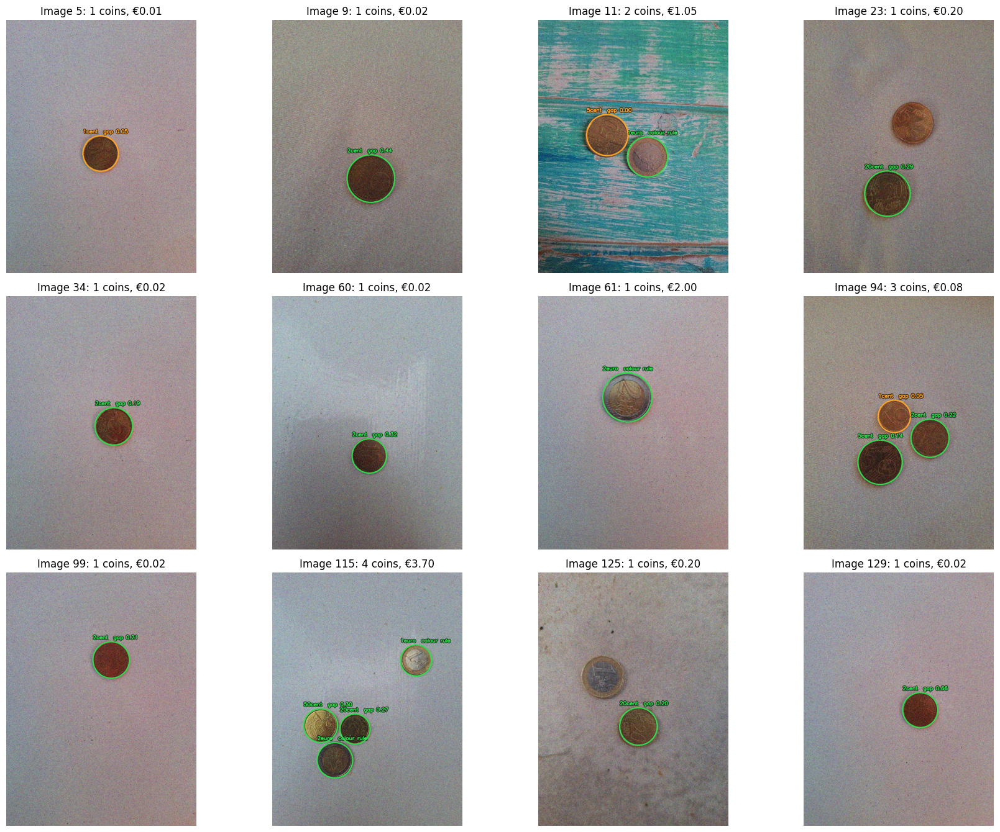

In [ ]:
# ================================================================
SHOW_ALL_IMAGES = False  # Set to True to display all images in order.
# ================================================================

N_INSPECTION_IMAGES = 12
IMAGES_PER_FIGURE = 20
INSPECTION_SEED = None  # Set an integer for a repeatable sample.

if SHOW_ALL_IMAGES:
    result_indices = list(range(1, len(target_data) + 1))
else:
    rng = np.random.default_rng(INSPECTION_SEED)
    result_indices = sorted(rng.choice(
        np.arange(1, len(target_data) + 1),
        size=min(N_INSPECTION_IMAGES, len(target_data)), replace=False
    ).tolist())

batch_size = IMAGES_PER_FIGURE if SHOW_ALL_IMAGES else len(result_indices)
ncols = 4

for batch_start in range(0, len(result_indices), batch_size):
    batch_indices = result_indices[batch_start:batch_start + batch_size]
    nrows = int(np.ceil(len(batch_indices) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(18, 4.5 * nrows))
    axes = np.atleast_1d(axes).ravel()

    for ax, image_index in zip(axes, batch_indices):
        data = target_data[image_index - 1]
        displayed = data["rgb"].copy()
        total_cents = 0

        for coin in data["coin_rois"]:
            x, y, radius = coin["circle"]
            prediction = coin["prediction"]
            total_cents += prediction["value"]
            margin = prediction["decision_margin"]
            strong = np.isnan(margin) or margin >= 0.12
            colour = (50, 220, 80) if strong else (255, 165, 40)
            cv2.circle(displayed, (x, y), radius, colour, 4)

            certainty = (
                "colour rule" if np.isnan(margin) else f"gap {margin:.2f}"
            )
            corrected = (
                "*" if prediction.get("consistency_corrected", False) else ""
            )
            text = f"{prediction['label']}{corrected}  {certainty}"
            position = (max(5, x - radius), max(25, y - radius - 10))
            cv2.putText(displayed, text, position, cv2.FONT_HERSHEY_SIMPLEX,
                        0.65, (0, 0, 0), 5, cv2.LINE_AA)
            cv2.putText(displayed, text, position, cv2.FONT_HERSHEY_SIMPLEX,
                        0.65, colour, 2, cv2.LINE_AA)

        ax.imshow(displayed)
        ax.set_title(
            f"Image {image_index}: {len(data['coin_rois'])} coins, "
            f"€{total_cents / 100:.2f}"
        )
        ax.axis("off")

    for ax in axes[len(batch_indices):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()


## 7. Ablation study and discarded alternatives

During development, several alternatives were tested before selecting the final pipeline. The study below is qualitative: methods were compared through the stability of detections, the number and location of useful keypoints, the consistency of matches and visual inspection of the final predictions.

The purpose of the table is not to claim that every discarded method is generally inferior. It records why a method was less suitable for this specific dataset, which contains blurred references, noisy target images, strong rotations and large illumination changes.

| Experiment | Motivation | Main observation or problem | Final decision |
|---|---|---|---|
| Hough and detection preprocessing | Compare different Hough parameters and Gaussian, median, bilateral, mean-shift, Canny and adaptive-threshold inputs | Very permissive settings improved recall but also reacted to texture and internal coin edges. A single light filter was not enough for all backgrounds | Use one global Hough configuration after Gaussian and median smoothing plus morphological closing |
| Elliptical Hough and `fitEllipse` | Model coins viewed from an oblique angle more accurately than a circle | Texture and internal engravings often produced unstable ellipse contours. The estimated axes could follow details inside the coin instead of the outer rim | Keep Hough circles as the main geometry and estimate radial-edge reliability separately |
| Original and component-filtered spike removal | Remove the small green luminous points before feature extraction | Thresholding the median residual alone selected too many pixels, including real edges. Excluding stable edges and large connected components preserved more details | Keep local median replacement only for small components away from stable edges and the outer border |
| Non-Local Means, CLAHE and unsharp masking | Produce cleaner and sharper crops before SIFT | The result sometimes looked sharper, but noise and artificial edges were amplified. Some already blurred references lost their remaining structure | Use mild bilateral filtering for the ROIs and reserve stronger smoothing for Hough detection |
| Processing the original blue-looking targets | Avoid making assumptions about the unusual channel order | The estimated metal colours became implausible and radial colour measurements were inconsistent with the references | Correct the working channel convention once and use it consistently |
| HSV-channel SIFT | Test Hue, Saturation, Value and a weighted V/S combination as descriptor inputs | The number of keypoints often increased, but hue was unstable on low-saturation areas and saturation emphasised coloured noise. More points did not give more stable matches | Extract SIFT from grayscale CLAHE images. HSV is kept only for colour-family features |
| SIFT baseline, tuning and inner masking | Improve the small number of keypoints found on blurred coins | Permissive settings added many points on noise and on the artificial circular border. Keeping only large keypoints left too few correspondences | Resize ROIs to 256 × 256, apply CLAHE, use moderate SIFT parameters and erode the mask before detection |
| Equal reference-keypoint count | Prevent sharp references from dominating references with fewer keypoints | The weakest reference set the limit, so useful descriptors from clearer coins were discarded | Keep all available descriptors and apply the clipped reference weight `[0.80, 1.25]` |
| HOG with median-filled background | Describe internal gradients while reducing the artificial mask boundary | The descriptor was still influenced by large contours and required explicit handling of rotation | Prefer the polar gradient representation, where rotation becomes a simple shift |
| Large-scale DoG features | Focus detection on numerals and large structures instead of micro-details | Larger scales produced more meaningful features than small scales, but threshold and NMS settings were sensitive and added a second custom keypoint pipeline | Retain standard SIFT for local evidence and use the polar descriptor for larger structures |
| SIFT matching alone | Recognise denominations through Lowe filtering, mutual matching and RANSAC inliers | Blur and large rotations left some coins with very few geometrically consistent matches | Keep SIFT as weak local evidence and complement it with the polar score |
| Polar descriptor and geometry TTA | Compare the global gradient structure across rotation and small centre/radius errors | The polar descriptor was stable and useful. Testing several shifted and scaled geometries improved difficult cases but substantially increased computation and implementation complexity | Keep one polar descriptor from the detected geometry and give it the larger appearance weight |
| Gold digit-band weighting | Give extra importance to the radial area containing the large 10/20/50 numerals | It helped some gold coins but depended strongly on crop alignment and introduced a special rule for only one family | Use the complete polar descriptor in the simplified final pipeline |
| Hard and soft colour gates | Decide how strongly metal colour should restrict denomination candidates | Soft gates allowed implausible bronze/gold switches. Hard separation was more stable for single-metal coins, while €1/€2 still benefited from their signed centre/ring structure | Use a hard family gate and a dedicated bimetallic metal-order rule |
| Absolute size prior and per-image scale | Use the official coin diameters to classify weak appearance matches | Absolute pixel size did not transfer across camera distances. A freely estimated scale could also support a wrong but internally consistent assignment | Use only relative diameter ratios, anchored by the coin with the clearest local decision |
| Tilt-aware soft size and same-label check | Use geometry without forcing unreliable radius measurements | Hard size rules failed on oblique coins. Comparing equal labels was useful only when both boundaries were sufficiently circular | Weight size by circular-edge reliability and revise only the lower-margin label when reliable radii strongly disagree |

### 7.1 Main conclusions from the experiments

The experiments suggest that the two main tasks require different levels of smoothing. Coin detection benefits from stronger filtering because it only needs the outer circular boundary. Classification requires a lighter treatment, since excessive denoising removes exactly the engravings needed to separate denominations.

They also show why the final classifier does not depend on a single feature. Colour is reliable for broad metal families but not for denominations inside a family. SIFT provides precise local evidence but becomes sparse under blur. The polar descriptor is more stable under rotation and blur, but it is less specific. Relative size is physically meaningful, although only when geometry is reliable. The final weighted model combines these complementary strengths and reduces the effect of their individual failure cases.

## 8. Final conclusion

This work shows that useful coin detection and counting results can be obtained with traditional computer-vision techniques, even when the photographs are not fully controlled. The final pipeline combines Hough circles, colour families, SIFT correspondences, a rotation-tolerant polar descriptor and physical diameter ratios. These cues complement each other, and unreliable size measurements are automatically given less influence. The method requires no training and its decisions remain relatively easy to inspect.

However, the experiments also show the limits of handcrafted features. Fixed thresholds and filters are difficult to adapt to strong changes in illumination, blur, background texture, scale and viewpoint. A setting that improves a noisy image may remove useful details from a clean one. Oblique coins make circular measurements less accurate, while blurred coins may contain too few stable keypoints for SIFT.

The reference set creates an additional limitation because only one image is available for each denomination. Some references, especially the 1 cent coin, are already blurred. If an important numeral or engraving is unclear in the reference, preprocessing cannot recover the missing information and aggressive sharpening may only create artificial edges.

A convolutional neural network trained on many varied examples could learn features that are more robust to these changes. It could also benefit from augmentation over rotation, colour, scale and blur. On the other hand, this would require a larger labelled dataset, more computation and careful validation.

A possible future solution is therefore a hybrid pipeline: retain Hough detection and interpretable colour/geometry checks, but replace the most fragile reference-matching stage with a learned embedding or small classifier. Overall, the project demonstrates both the potential of carefully combined traditional methods and their practical limit when image variability becomes larger than fixed rules can represent.